In [23]:
#Creation of the different artificial strains and the FBA dataset for the 
#neurons shutdown (4.3.3)

In [24]:
import cobra
import numpy as np
import random as rd
import math
from tensorflow.keras.layers import Layer, Lambda, Dense, Multiply, Activation, BatchNormalization, Dropout, Input, concatenate
from tensorflow.keras import Model, Sequential
from tensorflow.keras.models import clone_model, load_model
from tensorflow.math import sign as tfsign
import pickle
import os
import matplotlib.pyplot as plt
import keras.backend as K

In [25]:
def prepareNetInput(all_inps):
    inps=[]
    for ind in all_inps:
        inps.append(np.asarray(ind))
    return np.asarray(inps)

def prepareNetOutput(all_outs):
    outs=[[] for i in range(len(all_outs[0]))]
    for ifba in range(len(all_outs)):
        for ilay in range(len(all_outs[ifba])):
            outs[ilay].append(np.array(all_outs[ifba][ilay]))
    for i in range(len(all_outs[0])):
        outs[i]=np.asarray(outs[i])
    return outs

def saveInOut(netInps, netOuts, filebase, append=True):
    '''Save the input and output using pickle
    '''
    infn, outfn = filebase + '_inputs.pickle', filebase + '_outputs.pickle'
    if infn in os.listdir() or outfn in os.listdir():
        if append:
            preinp, preout = loadInOut(filebase)
            netInps = np.append(preinp,netInps,axis=0)
            for i in range(len(preout)):
                netOuts[i] = np.append(preout[i],netOuts[i],axis=0)
    with open(infn, 'wb') as handle:
        pickle.dump(netInps, handle)
    with open(outfn, 'wb') as handle:
        pickle.dump(netOuts, handle)
    return

def loadInOut(filebase):
    '''Load the input and output using pickle
    '''
    infn, outfn = filebase + '_inputs.pickle', filebase + '_outputs.pickle'
    with open(infn,'rb') as finputs:
        netInps = pickle.load(finputs)
    with open(outfn, 'rb') as foutputs:
        netOuts = pickle.load(foutputs)
    return netInps, netOuts

def reitOutputs(netOuts, nreit):
    '''Repeats the first layer of the outputs the number of times that is
    repeated in the model
    '''
    nO=[netOuts[0]]
    for i in range(nreit):
        nO.append(netOuts[0])
    nO.append(netOuts[1])
    return nO

def nonzeroidx_output(output, limit = 0.05):
    '''Find the metabolites that change for all the dataset. A metabolite is considered not to change if its values
    are 0 for more than (1-limit) proportion'''
    nonzero = limit*output.shape[0]
    nonzeros_idx=[]
    for j in range(output.shape[1]):
        cur_nonzeros = len(np.where(abs(output[:,j])>0.001)[0])
        if cur_nonzeros > nonzero and not checkEqual(output[:,j]):
            nonzeros_idx.append(j)
    return nonzeros_idx

#Normalize the outputs
def norm_outputs(outputs, incr=0):
    '''Normalize the outputs as (X-min)/(max-min)
    The range can be increased a % over the maximum and minimum so the predictions can excede the 
    dataset values'''
    mins = np.min(outputs,axis=0) - np.abs(np.min(outputs, axis=0)*incr)
    maxs = np.max(outputs,axis=0) + np.abs(np.max(outputs, axis=0)*incr)
    return (outputs-mins) / (maxs-mins), maxs, mins

#Normalize the outputs
def norm_outputs_withZeros(outputs, incr=0):
    '''Normalize the outputs as (X-min)/(max-min)
    The range can be increased a % over the maximum and minimum so the predictions can excede the 
    dataset values'''
    mins = np.min(outputs,axis=0) - np.abs(np.min(outputs, axis=0)*incr)
    maxs = np.max(outputs,axis=0) + np.abs(np.max(outputs, axis=0)*incr)
    nouts = outputs.copy()
    for j in range(outputs.shape[1]):
        if maxs[j] != mins[j]:
            nouts[:,j] = (outputs[:,j]-mins[j]) / (maxs[j]-mins[j])
    return nouts, maxs, mins

def normTanhOutputs(outputs):
    '''Normalize the outputs as 2((X-min)/(max-min))-1
    In the range [-1, 1]'''
    mins = np.min(outputs,axis=0)
    maxs = np.max(outputs,axis=0)
    zero2one = (outputs-mins) / (maxs-mins)
    return 2 * zero2one - 1, maxs, mins

def norm2real(predictions,maxs,mins):
    '''Return the denormalized values of the output'''
    return predictions * (maxs-mins) + mins

def checkEqual(iterator):
    '''Check if all values in a vector are equal'''
    return len(set(iterator)) <= 1

In [26]:
def random_medium(model, mini=0.0, maxi=1000):
    '''Return a dictionary with random values for the metabolites ina  medium
    '''
    medium={}
    inputIds = get_influxesIds(model)
    for metab in inputIds:
        medium[metab] = rd.uniform(mini, maxi)
    return medium

def batch_of_FBAs_MNN(model, layers, num=100, vb=True):
    '''Returns two lists with the dictionaries of mediums and fluxes
    '''
    all_mediums = []
    all_outs, all_inps = [], []
    i=0
    while i<num:
        all_mediums.append(random_medium(model))
        cur_fluxes = FBA_output_fluxes_MNN(model, all_mediums[-1], layers)
        if cur_fluxes != None:
            all_inps.append(list(all_mediums[-1].values()))
            all_outs.append(cur_fluxes)
            i+=1
            if i%(num/10)==0 and vb:
                print('Created {}/{}'.format(i,num))

    return prepareNetInput(all_inps), prepareNetOutput(all_outs)

def get_fluxes(m):
    '''Return the metabolites that are exchanged in and out of the cell
    '''
    fluxes = {}
    for exch in m.exchanges:
        fluxes[exch.id] = exch.flux
    return fluxes

def FBA_output_fluxes_MNN(model, medium, layers, bio=False):
    '''Returns the exchanged fluxes and the biomass with FBA
    '''
    with model:
        model.medium = medium
        biomass=model.slim_optimize()
        if math.isnan(biomass):
            if bio:
                return None, None
            else:
                return None
        
        fluxes = []
        for lay in layers:
            fluxes.append([])
            for r in lay:
                fluxes[-1].append(r.flux)
    if bio:
        return fluxes, biomass
    else:
        return fluxes

def get_influxesIds(m):
    '''Returns a list with the metabolites that can be taken by the cell
    '''
    influxes = []
    for exch in m.exchanges:
        if exch.reaction.split()[-1] == '<=>':
            influxes.append(exch.id)
    if 'EX_h2o_e' in influxes:
        influxes.remove('EX_h2o_e')
    return influxes

def get_fluxesIds(m):
    '''Return the metabolites that are exchanged in and out of the cell
    '''
    fluxes = []
    for exch in m.exchanges:
        fluxes.append(exch.id)
    return fluxes

def dic2array(dic):
    '''Return an array that is complementary to the dictionary and the keys of the dictionary'''
    data = []
    for metab in dic:
        data.append(np.array(dic[metab]))
    data = np.array(data).T
    return data, list(dic.keys())

def dataset2dic(inputs, netOutputs, FBAmodel, numberFBAs=-1):
    '''Returns the input, output as dictionaries with the ids of the metabolites as keys'''
    inps, reacts, outs = {}, {}, {}
    reactions, outputs = netOutputs
    
    medium_metabs = get_influxesIds(FBAmodel)
    glayers, glayersIds = grrann_layers(FBAmodel, outputs)
        
    if numberFBAs == -1:
        numberFBAs = inputs.shape[0]
        
    for i in range(len(medium_metabs)):
        inps[medium_metabs[i]] = list(inputs[:numberFBAs,i])
        
    for i in range(len(glayersIds[0])):
        reacts[glayersIds[0][i]] = list(reactions[:numberFBAs,i])
    
    for i in range(len(glayersIds[-1])):
        outs[glayersIds[-1][i]] = list(outputs[:numberFBAs,i])
     
    return inps, reacts, outs

def addDicIndivs(cur_dic, total_dic, addNew=True):
    '''Add the data in the cur_dic into the total_dic
    Metabs in the toal_dic that are not found in cur_dic are filled with 0s for this cur_dic individuals
    Metabs in the cur_dic that are not found in the total_dic are added filling with 0s for the previous individuals (addMetab2dic)'''
    ninds = len(cur_dic[list(cur_dic.keys())[0]])
    if total_dic == {}:
        prev_ninds = 0
    else:
        prev_ninds = len(total_dic[list(total_dic.keys())[0]])
    for metab in total_dic:
        if metab in cur_dic:
            total_dic[metab] += cur_dic[metab]
        else:
            total_dic[metab] += [0]*ninds
    if addNew:
        for metab in cur_dic:
            if not metab in total_dic:
                total_dic = addMetab2dic(metab,total_dic, prev_ninds)
                total_dic[metab] += cur_dic[metab]            
    return total_dic

def addMetab2dic(metab, dic, ninds):
    '''Add a metabolite to the dic that was not present before, filling with zeros that metabolite in the previous indivs'''
    dic[metab] = [0] * ninds
    return dic

def get_inputReactions(m):
    '''Returns a list with the reactions of the metabs that can be taken by the cell
    '''
    influxes = []
    for exch in m.exchanges:
        if exch.reaction.split()[-1] == '<=>':
            if exch.id != 'EX_h2o_e':
                influxes.append(exch)
    return influxes

def get_outputReactions(m):
    '''Return the list with the reactions that are exchanged in and out of the cell
    '''
    fluxes = []
    for exch in m.exchanges:
        if exch.id != 'EX_h2o_e':
            fluxes.append(exch)
    return fluxes

def get_inputMetabs(m):
    '''Returns a list with the metabs that can be taken by the cell
    '''
    reactions = get_inputReactions(m)
    metabs=[]
    for r in reactions:
        if not 'h_e' in r.reactants[0].id:
            metabs.append(r.reactants[0])
    return metabs

def get_outputMetabs(m):
    '''Return the list with the metabs that are exchanged in and out of the cell
    '''
    reactions = get_outputReactions(m)
    metabs = []
    for r in reactions:
        metabs.append(r.reactants[0])
    return metabs

def deleteMetabolites(vector, metabs):
    '''Remove metabolites objects which ids are in the list metabs from the list vector
    '''
    for m in vector:
        if m.id in metabs:
            vector.remove(m)
    return vector

def getReactantsProducts(reaction):
    '''Return the reactants and the products of a reaction. Takes in account if the reaction
    is reversible
    '''
    notInclude = ['h_c','h_e', 'h2o_e', 'h2o_c']
    r_raw, p_raw = reaction.reactants, reaction.products
    r, p = deleteMetabolites(r_raw, notInclude), deleteMetabolites(p_raw, notInclude)
    if not '<' in reaction.reaction:
        return r, p
    else:
        return r+p, r+p

def metabolitesGraph(m):
    '''Create a graph where the nodes are the reactions.
    Graph: {metabSource:[metabsTarget]}
    '''
    graph = {}
    for reaction in m.reactions:
        reactants, products = getReactantsProducts(reaction)
        for r in reactants:
            if not r in graph:
                graph[r] = []
            for p in products:
                graph[r].append(p)

    #Adding final metabolites with no further reactions
    for met in m.metabolites:
        if met not in graph:
            graph[met]=[]
    return graph

def get_inicialReacts(m):
    '''Returns the initial reactions (the ones where the external input metabolites are included
    '''
    iReacts = []
    sourcesMetabs = get_inputMetabs(m)
    for r in m.reactions:
        if not 'EX_' in r.id:
            for met in r.reactants:
                if met in sourcesMetabs:
                    iReacts.append(r)
    return iReacts

def reactionsGraph(m):
    '''Create a graph where the nodes are the reactions.
    Graph: {reactionSource:[reactionsTarget]}
    '''
    graph = {}
    for metab in m.metabolites:
        users, producers = [], []
        for r in metab.reactions:
            reactants, products = getReactantsProducts(r)
            if metab in reactants:
                users.append(r)
            if metab in products:
                producers.append(r)
            
        for p in producers:
            if not p in graph:
                graph[p]=[]
            for u in users:
                if u!=p:
                    graph[p].append(u)
    #Adding final reactions with no further reactions
    for r in m.reactions:
        if r not in graph:
            graph[r]=[]
    return graph


In [27]:
def bfs_layers(graph, sources):
    '''Return the layers corresponding to the distance to the sources in a directed graph
    using breadth first search. #Biomass added after bigger layer.
    '''
    layers, vis = [sources],[*sources]
    layersIds=[[]]
    for s in vis:
        layersIds[0].append(s.id)

    il=0
    while len(layers[il]) > 0:
        layers.append([])
        layersIds.append([])
        for s in layers[il]:
            for t in graph[s]:
                if not t in vis:
                    vis.append(t)
                    layers[-1].append(t)
                    layersIds[-1].append(t.id)
        il+=1
    layers.pop()
    layersIds.pop()
##    longerLayer = layers.index(max(layers,key=len))
##    layers[longerLayer+1].append('Biomass')
##    layersIds[longerLayer+1].append('Biomass')
    return layers, layersIds

def findRealBiomass(exIds, outputs):
    '''Find the real biomass index'''
    maxidx, maxis = [], []
    for i in range(len(exIds)):
        exId = exIds[i]
        if 'biomass' in exId.lower():
            maxis.append(np.mean(outputs[:,i]))
            maxidx.append(i)
    preIdx = maxis.index(max(maxis))
    bioIdx = maxidx[preIdx]
    return bioIdx

def grrann_layers(m, outputs = 2):
    '''Given a cobra model, returns a list with the reactions of the model and another list
    with its exchanges and the BIOMASS reactions 
    Sometimes, there appear several biomass reactions, most of them null. To recognise the real biomass reaction
    we need data (outputs) and check which has the maximum values
    '''
    reactions, exchanges = [], []
    reIds, exIds = [], []
    for reaction in m.reactions:
        if 'EX_' in reaction.id or 'BIOMASS' in reaction.id:
            exchanges.append(reaction)
            exIds.append(reaction.id)
        else:
            reactions.append(reaction)
            reIds.append(reaction.id)
            
    if type(outputs) == type(np.array([])):
        bioIdx = findRealBiomass(exIds, outputs)
        exIds[bioIdx] = 'Biomass'
    
    return [reactions, exchanges], [reIds, exIds]

In [28]:
def neural_net_sequential(x_train, y_train):
    '''Returns a convetional neural network with the optimized parameters'''
    ninp, nout = x_train.shape[1], y_train.shape[1]
    model = tf.keras.Sequential()
    model.add(Dense(64, input_shape=(ninp,), activation='relu'))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(nout))
    model.compile(loss='mean_squared_error', optimizer='Adam', metrics=['mae'])

    return model

def build_MNNv1_0(inp_medium, layers):
    '''Build an Metabolic Neural Network where where each neuron represents a reaction
    There might be extra neurons to cover some dependencies.
    The input layer covers the fluxes in the medium, then 2 extra layers are added, to
    predict the actual flux of this metabolites into the cell, which is the first metabolic layers
    '''
    ninp = len(inp_medium)
    inputLayer = Input(shape=(ninp,))
    x=Dense(ninp*3, activation='relu', name='inputLayer0')(inputLayer)
    x=Dense(ninp*3, activation='relu', name='inputLayer1')(x)
    
    mLayer0=Dense(len(layers[0])+10, activation='relu', name='mLayer0')(x)
    out0 = Lambda(lambda x: x[:,:len(layers[0])])(mLayer0)
    
    mLayer1=Dense(len(layers[1])+10, activation='relu', name='mLayer1')(mLayer0)
    mLayer2=Dense(len(layers[2])+10, activation='relu', name='mLayer2')(mLayer1)
    mLayer3=Dense(len(layers[3])+10, activation='relu', name='mLayer3')(mLayer2)
    mLayer4=Dense(len(layers[4])+10, activation='relu', name='mLayer4')(mLayer3)

    model = Model(inputs=inputLayer,
                  outputs=[out0, mLayer1, mLayer2, mLayer3, mLayer4],
                  name="metabolicnnet")
    return model

def build_MNNv1_1(inp_medium, layers):
    '''Build an Metabolic Neural Network where where each neuron represents a reaction
    There might be extra neurons to cover some dependencies.
    The input layer covers the fluxes in the medium, then 2 extra layers are added, to
    predict the actual flux of this metabolites into the cell, which is the first metabolic layers
    '''
    ninp = len(inp_medium)
    extraNeurons = 40
    
    inputLayer = Input(shape=(ninp,), name='Input_medium')
    x=Dense(ninp*4, activation='relu', name='Extra_layer1')(inputLayer)

    mnLayers=[Dense(ninp*3, activation='relu', name='Extra_layer2')(x)]
    outs, losses, wlosses = [], {}, {}
    for i in range(len(layers)):
        mnLayers.append(Dense(len(layers[i])+extraNeurons, activation='linear',
                              name='mLayer'+str(i))(mnLayers[-1]))
        losses['Output'+str(i)]='mean_squared_error'
        wlosses['Output'+str(i)]=len(layers[i])
        outs.append(Lambda(lambda x: x[:,:len(layers[i])],
                           name='Output'+str(i))(mnLayers[-1]))

    model = Model(inputs=inputLayer,
                  outputs=outs,
                  name="metabolicnnet")
    model.compile(optimizer='Adam', metrics=['mae'],
                  loss=losses, loss_weights = wlosses)
    return model

def build_MNNv2_0(inp_medium, layers, nreit, reactLossW = 0.5):
    '''Build an Metabolic Neural Network where where each neuron represents a reaction
    There might be extra neurons to cover some dependencies.
    The input layer covers the fluxes in the medium, then 2 extra layers are added, to
    predict the actual flux of this metabolites into the cell, which is the first metabolic layers
    '''
    ninp = len(inp_medium)

    #Input layer with the medium concentrations
    inputLayer = Input(shape=(ninp,), name='Input_medium')

    #Reactions layers repeated nreit times as dense layers
    outs, losses, wlosses = [], {}, {}
    mnnLayers=[Dense(len(layers[0]), activation='linear',
                     name='ReactLayer0')(inputLayer)]
    losses['ReactLayer0'] = 'mean_squared_error'
    wlosses['ReactLayer0'] = reactLossW/(nreit+1)
    outs.append(mnnLayers[-1])
    for i in range(1,nreit+1):
        mnnLayers.append(Dense(len(layers[0]), activation='tanh',
                              name='ReactLayer'+str(i))(mnnLayers[-1]))
        losses['ReactLayer'+str(i)] = 'mean_squared_error'
        wlosses['ReactLayer'+str(i)] = reactLossW/(nreit+1)
        outs.append(mnnLayers[-1])

    #Output layer with the fluxes exchanges
    outputLayer = Dense(len(layers[1]), activation='tanh',name='OutputLayer')(mnnLayers[-1])
    losses['OutputLayer'] = 'mean_squared_error'
    wlosses['OutputLayer'] = 1-reactLossW
    outs.append(outputLayer)

    model = Model(inputs=inputLayer,
                  outputs=outs,
                  name="MetabolicNeuralNetv2.0")
    model.compile(optimizer='Adam', metrics=['mae'],
                  loss=losses, loss_weights = wlosses)
    return model

In [29]:
class CustomConnected(Dense):
    '''Derivation of a Dense layer where the conexions can be specified'''
    def __init__(self,units,connections,**kwargs):
        #this is matrix A
        self.connections = connections  
        self.unit = units
        #initalize the original Dense with all the usual arguments   
        super(CustomConnected,self).__init__(units,**kwargs)  

    def call(self, inputs):
        output = K.dot(inputs, self.kernel * self.connections)
        if self.use_bias:
            output = K.bias_add(output, self.bias)
        if self.activation is not None:
            output = self.activation(output)
        return output
    
    def get_config(self):
        config = {'connections': self.connections,
                  'units': self.units}
        base_config = super(CustomConnected, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

def metabsNoCompartment(metabs):
    '''Return a list with the metabolites in metabs removing the compartment (metab_comp)
    '''
    ms=[]
    for m in metabs:
        ms.append('_'.join(m.id.split('_')[:-1]))
    return ms
    
def getConnectionsMatrix(glayers):
    '''Build the sparse connections matrix for the last layer of the MNNv2
    Reactions in previous layer which use or produce the metabolite exchanged in the neuron
    of the output layer are set to 1.
    '''
    mat = np.zeros((len(glayers[0]), len(glayers[1])))
    for i in range(len(glayers[0])):
        metabs = list(glayers[0][i].metabolites.keys())
        metabs = metabsNoCompartment(metabs)
        for j in range(len(glayers[1])):
            exchangeMetabs = list(glayers[1][j].metabolites.keys())
            exchangeMetabs = metabsNoCompartment(exchangeMetabs)
            common = set(metabs).intersection(set(exchangeMetabs))
            if len(common)>0:
                mat[i,j]=1
    return mat

def conventionalNN(x_train, y_train, act='relu'):
    '''Returns a model with a conventional fully connected neural network'''  
    x_train, y_train = np.array(x_train), np.array(y_train)
    ninp, nout = x_train[0].shape[1], y_train.shape[1]
    model = Sequential()
    model.add(Dense(512, input_shape=(ninp,), activation=act))
    model.add(Dense(nout))
    
    model.compile(loss='mean_squared_error', optimizer='Adam', metrics=["accuracy",'mae'])
    return model

def build_MNNv2_1(inp_medium, layers, nreit, activs = ['relu', ''], matConnections=[], reactLossW = 0.5):
    '''Build a GRRANN-like Metabolic Neural Network where where each neuron represents a reaction
    The input layer covers the fluxes in the medium, then reactions layer(s) are added, to
    predict the actual flux of this metabolites into the cell, which is the first metabolic layers
    '''
    ninp = len(inp_medium)
    if matConnections == []:
        matConnections = np.ones((len(layers[0]), len(layers[1])))

    #Input layer with the medium concentrations
    inputLayer = Input(shape=(ninp,), name='Input_medium')

    #Reactions layers repeated nreit times as dense layers
    outs, losses, wlosses = [], {}, {}
    mnnLayers=[Dense(len(layers[0]), activation = activs[0],
                     name='ReactLayer0')(inputLayer)]
    losses['ReactLayer0'] = 'mean_squared_error'
    wlosses['ReactLayer0'] = reactLossW/(nreit+1)
    outs.append(mnnLayers[-1])
    for i in range(1,nreit+1):
        mnnLayers.append(Dense(len(layers[0]), activation = activs[0],
                              name='ReactLayer'+str(i))(mnnLayers[-1]))
        losses['ReactLayer'+str(i)] = 'mean_squared_error'
        wlosses['ReactLayer'+str(i)] = reactLossW/(nreit+1)
        outs.append(mnnLayers[-1])

    #Output layer with the fluxes exchanges
    if activs[1] != '':
        outputLayer = CustomConnected(len(layers[1]), matConnections, activation = activs[1],
                                      name='OutputLayer')(mnnLayers[-1])
    else:
        outputLayer = CustomConnected(len(layers[1]), matConnections,
                                      name='OutputLayer')(mnnLayers[-1])
    losses['OutputLayer'] = 'mean_squared_error'
    wlosses['OutputLayer'] = 1-reactLossW
    outs.append(outputLayer)

    model = Model(inputs=inputLayer,
                  outputs=outs,
                  name="MetabolicNeuralNetv2.0")
    model.compile(optimizer='Adam', metrics=['mae'],
                  loss=losses, loss_weights = wlosses)
    return model

def build_MNNv2_2(inp_medium, layers, nreit, nneurons=128, activ='relu', matConnections=[], reactLossW = 0.5):
    '''Build a HBB Metabolic Neural Network 
    The input layer covers the fluxes in the medium, then extra dense layers are added, to
    predict the actual flux of this metabolites into the cell, which is the first metabolic layers
    '''
    ninp = len(inp_medium)

    #Input layer with the medium concentrations
    inputLayer = Input(shape=(ninp,), name='Input_medium')

    #Extra Dense layers
    mnnLayers=[Dense(nneurons, activation=activ)(inputLayer)]
    for i in range(1,nreit+1):
        mnnLayers.append(Dense(nneurons, activation=activ)(mnnLayers[-1]))
    
    #Reaction layer 
    outs, losses, wlosses = [], {}, {}
    rLayer=Dense(len(layers[0]), activation='relu', name='ReactLayer')(mnnLayers[-1])
    losses['ReactLayer'] = 'mean_squared_error'
    wlosses['ReactLayer'] = reactLossW
    outs.append(rLayer)

    #Output layer with the fluxes exchanges
    if matConnections == []:
        outputLayer = Dense(len(layers[1]), name='OutputLayer')(rLayer)
    else:
        outputLayer = CustomConnected(len(layers[1]), matConnections,
                                      name='OutputLayer')(rLayer)
    losses['OutputLayer'] = 'mean_squared_error'
    wlosses['OutputLayer'] = 1-reactLossW
    outs.append(outputLayer)

    model = Model(inputs=inputLayer,
                  outputs=outs,
                  name="MetabolicNeuralNetv2.0")
    model.compile(optimizer='Adam', metrics=['mae'],
                  loss=losses, loss_weights = wlosses)
    return model

def build_MNNv2_3(inp_medium, normZeros, layers, nreit, nneurons=128, activ='relu', matConnections=[], reactLossW = 0.5):
    '''Build a HBB Shutdown Metabolic Neural Network 
    The input layer covers the fluxes in the medium and a strain input defines which reactions
    layers are shuwtdown and which are active.
    Predict the actual flux of this metabolites into the cell, which is the first metabolic layers
    '''
    ninp = len(inp_medium)
    nReact = len(layers[0])
    
    #Input layer with the medium concentrations
    inputMedium = Input(shape=(ninp,), name='InputMedium')
    inputStrain = Input(shape=(nReact,), name='InputStrain')

    #Extra Dense layers
    mnnLayers=[Dense(nneurons, activation=activ)(inputMedium)]
    for i in range(1,nreit+1):
        mnnLayers.append(Dense(nneurons, activation=activ)(mnnLayers[-1]))
    
    #Reaction layer 
    outs, losses, wlosses = [], {}, {}
    rLayer = Dense(len(layers[0]), activation='relu', name='ReactLayer0')(mnnLayers[-1])
    rLayer = maskedActivation0(inputStrain, normZeros, name='ReactLayer')(rLayer)
    losses['ReactLayer'] = 'mean_squared_error'
    wlosses['ReactLayer'] = reactLossW
    outs.append(rLayer)

    #Output layer with the fluxes exchanges
    if matConnections == []:
        outputLayer = Dense(len(layers[1]), name='OutputLayer')(rLayer)
    else:
        outputLayer = CustomConnected(len(layers[1]), matConnections,
                                      name='OutputLayer')(rLayer)
    losses['OutputLayer'] = 'mean_squared_error'
    wlosses['OutputLayer'] = 1-reactLossW
    outs.append(outputLayer)

    model = Model(inputs=[inputMedium, inputStrain],
                  outputs=outs,
                  name="MetabolicNeuralNetv2.3")
    model.compile(optimizer='Adam', metrics=['mae'],
                  loss=losses, loss_weights = wlosses)
    return model

def build_MNNv2_4(inp_medium, normZeros, layers, nreit, nneurons=128, activs = ['relu', ''], matConnections=[], reactLossW = 0.5):
    '''Build a GRRANN-like Metabolic Neural Network where where each neuron represents a reaction
    The input layer covers the fluxes in the medium, then reactions layer(s) are added, to
    predict the actual flux of this metabolites into the cell, which is the first metabolic layers
    '''
    ninp = len(inp_medium)
    nReact = len(layers[0])
    if matConnections == []:
        matConnections = np.ones((len(layers[0]), len(layers[1])))

    #Input layer with the medium concentrations
    inputLayer = Input(shape=(ninp,), name='Input_medium')
    inputStrain = Input(shape=(nReact,), name='InputStrain')

    #Reactions layers repeated nreit times as dense layers
    outs, losses, wlosses = [], {}, {}
    x = Dense(len(layers[0]), activation = activs[0], name='preReactLayer0')(inputLayer)
    mnnLayers=[maskedActivation0(inputStrain, normZeros, name='ReactLayer0')(x)]
    losses['ReactLayer0'] = 'mean_squared_error'
    wlosses['ReactLayer0'] = reactLossW/(nreit+1)
    outs.append(mnnLayers[-1])
    for i in range(1,nreit+1):
        x = Dense(nneurons, activation = 'relu', name='sandwichLayer')(mnnLayers[-1])
        x = Dense(len(layers[0]), activation = activs[0], name='preReactLayer'+str(i))(x)
        mnnLayers.append(maskedActivation0(inputStrain, normZeros, name='ReactLayer'+str(i))(x))
        losses['ReactLayer'+str(i)] = 'mean_squared_error'
        wlosses['ReactLayer'+str(i)] = reactLossW/(nreit+1)
        outs.append(mnnLayers[-1])

    #Output layer with the fluxes exchanges
    if activs[1] != '':
        outputLayer = CustomConnected(len(layers[1]), matConnections, activation = activs[1],
                                      name='OutputLayer')(mnnLayers[-1])
    else:
        outputLayer = CustomConnected(len(layers[1]), matConnections,
                                      name='OutputLayer')(mnnLayers[-1])
    losses['OutputLayer'] = 'mean_squared_error'
    wlosses['OutputLayer'] = 1-reactLossW
    outs.append(outputLayer)

    model = Model(inputs=[inputLayer, inputStrain],
                  outputs=outs,
                  name="MetabolicNeuralNetv2.0")
    model.compile(optimizer='Adam', metrics=['mae'],
                  loss=losses, loss_weights = wlosses)
    return model

def getInputStrain(reactions):
    '''Return the 0 / 1 vector with the absence / presence of the reactions
    '''
    sumi = np.sum(reactions, axis=0)
    inpStrain = np.ones(shape=(1,len(sumi)))[0]
    inpStrain[np.where(abs(sumi)==0)] = 0
    inpStrain = [inpStrain for i in range(reactions.shape[0])]
    return np.array(inpStrain)


In [30]:
#Layer that masks the selected neurons so their outputs become 0
class maskedActivation0(Layer):
    '''Derivation of a Dense layer where the neurons can be masked for the shutdown version
    Instead of zero, the neuron can be masked with the corresponding normalized value'''
    def __init__(self, mask, normZeros, **kwargs):
        self.mask = mask  
        self.normZeros = normZeros
        #initalize the original Dense with all the usual arguments   
        super(maskedActivation0,self).__init__(**kwargs)  

    def call(self, inputs):
        output = inputs * self.mask + self.normZeros * (1-self.mask)
        return output
    
class maskedActivation(Layer):
    '''Derivation of a Dense layer where the conexions can be specified
    
    MUST BE ADAPTED TO WORK WITH NORMALIZED FLUXES'''
    def __init__(self,mask,**kwargs):
        #this is matrix A
        self.mask = mask                        
        #initalize the original Dense with all the usual arguments   
        super(maskedActivation,self).__init__(**kwargs)  

    def call(self, inputs):
        signs = tfsign(inputs)
        output = Multiply()([K.minimum(K.abs(inputs), self.mask), signs])
        return output

def tryNet(nneu):
    '''Builds a dummy network with the custom layer'''
    inputLayer = Input(shape=(nneu,), name='Input_medium')
    inputReact = Input(shape=(nneu,), name='Input_strain')
    #x=Dense(4, activation ='relu')(inputLayer)
    x=maskedActivation(inputReact, name='maskedFluxes')(inputLayer)
    model = Model(inputs=[inputLayer, inputReact],
                  outputs=x,
                  name="trial")
    return model

#Checking the functioning of the masked activation layer
do=False
if do:
    #xMed = [[-1,1,1,1], [2,2,-2,2], [3,3,-3,3], [4,-4,4,-4], [5,5,5,5]]
    #xMask = [[0.5,0,1,0], [0,0,0.5,0], [1,0.5,1,0], [1,4,1,3], [0,0,0,0]]
    #outs = [[-0.5,0,1,0],[0,0,-0.5,0], [3,3,-1,0], [4,-4,4,-4], [0,0,0,0]]
    
    xMed = np.random.randint(-5,5, size=(10000,20))
    xMask = np.random.randint(-5,5, size=(10000,20))
    outs = np.random.randint(-5,5, size=(10000,20))
    
    n=tryNet(xMed.shape[1])
    n.summary()

    n.compile(loss='mean_squared_error', optimizer='Adam', metrics=['mae'])
    n.fit([xMed, xMask], [outs])

    print(n.predict([xMed, xMask]))

In [31]:
def crossvalidationSets(inputs, ncv, j):
    '''Retuns the training and testing subset of the set (inputs) for the ncv-folds crossvalidation
    in the iteration j'''
    n=inputs[0].shape[0]
    x_train, x_test = [], []
    for i in range(len(inputs)):
        xtrain1 = inputs[i][:int(n/ncv*j),:]
        xtrain2 = inputs[i][int(n/ncv*j+n/ncv):,:]
        xtrain12 = np.vstack([xtrain1,xtrain2])
        x_train.append(xtrain12)
        x_test.append(inputs[i][int(n/ncv*j):int(n/ncv*j+n/ncv),:])
    return x_train, x_test

def biomassIndex(glayersIds):
    '''Returns the biomass index'''
    for i in range(len(glayersIds)):
        if 'Biomass'  == glayersIds[i]:
            return i
    
def plotRealsPreds(reals, preds):
    bins = list(range(len(reals)))
    plt.plot(bins, reals, label='Reals')
    plt.plot(bins, preds, label='Preds')
    plt.legend(loc='upper right')
    plt.show()

def divide_set(s, train_prop, val_prop):
    '''Return the set divided in training, validationa and test sets'''
    val_prop = train_prop + val_prop
    x_train, x_val, x_test = [], [], []
    for i in range(len(s)):
        x_train.append(s[i][:int(train_prop*s[i].shape[0])])
        x_val.append(s[i][int(train_prop*s[i].shape[0]):int(val_prop*s[i].shape[0])])
        x_test.append(s[i][int(val_prop*s[i].shape[0]):])
    return x_train, x_val, x_test

def shuffle_dataset(datas):
    '''Randomly shuffles the databaset inputs and outputs with the same order (their rows are shuffled)'''
    s = np.arange(datas[0].shape[0])
    np.random.shuffle(s)
    for i in range(len(datas)):
        datas[i] = datas[i][s,:]
    return datas

def mean_square_error(a,b):
    '''Mean square error between two list numpy arrays'''
    return np.square(a-b).mean()

def mean_absolute_error(a,b):
    '''Mean absolute error between two list numpy arrays'''
    return np.abs(a-b).mean()

def plot_prediction_comparison(predictions, real, metab):
    '''Plot an histogram with the real and several predicted values overlapped'''
    maxi=100
    if len(real) > maxi:
        for i in range(len(predictions)):                       
            predictions[i]=predictions[i][:maxi]
        real=real[:maxi]
    
    bins = list(range(len(real)))
    if len(predictions) == 1:                           
        x, y = zip(*sorted(zip(real, predictions[0])))
    else:
        x, y, z = zip(*sorted(zip(real, predictions[0], predictions[1])))
        plt.scatter(bins, z, alpha=0.5, label='Prediction 2')

    plt.scatter(bins, x, alpha=0.5, label='Real')
    plt.scatter(bins, y, alpha=0.5, label='Prediction 1')
    plt.legend(loc='upper left')
    plt.title('Metabolite: {}'.format(metab))
    plt.show()
    
def plot_outputMNNv1(history):
    '''Plots the results of a trained neural network in version 1'''
    # PLOT LOSS AND ACCURACY
    %matplotlib inline
    #-----------------------------------------------------------
    # Retrieve a list of list results on training and test data sets for each training epoch
    #-----------------------------------------------------------
    loss=history.history['loss']
    epochs=range(len(loss)) # Get number of epochs

    #------------------------------------------------
    # Plot training and validation MAE per epoch
    #------------------------------------------------
    for i in history.history:
        if not 'loss' in i:
            plt.plot(epochs, history.history[i], label=i)
    
    #plt.legend(loc='upper right')
    plt.title('Losses and MAEs')
    plt.show()
    
def plot_output(history, nreit):
    '''Plots the results of a trained neural network'''
    # PLOT LOSS AND ACCURACY
    %matplotlib inline
    #-----------------------------------------------------------
    # Retrieve a list of list results on training and test data sets for each training epoch
    #-----------------------------------------------------------
    react_mae=history.history['ReactLayer{}_mean_absolute_error'.format(nreit)]
    val_react_mae=history.history['val_ReactLayer{}_mean_absolute_error'.format(nreit)]
    out_mae=history.history['OutputLayer_mean_absolute_error']
    val_out_mae=history.history['val_OutputLayer_mean_absolute_error']
    loss=history.history['loss']
    val_loss=history.history['val_loss']
    epochs=range(1,len(loss)+1) # Get number of epochs

    #------------------------------------------------
    # Plot training and validation MAE per epoch
    #------------------------------------------------
    plt.plot(epochs, react_mae, 'pink', label="Reactions Training MAE")
    plt.plot(epochs, out_mae, 'c', label="Output Training MAE")
    plt.plot(epochs, val_react_mae, 'r', label="Reactions Validation MAE")
    plt.plot(epochs, val_out_mae, 'b', label="Output Validation MAE")
    plt.legend(loc='upper right')

    plt.title('Validation MAE')
    plt.grid(linestyle='dotted')
    plt.xlabel('Number of epochs')
    plt.ylabel('MAE')
    plt.show()
    
    #------------------------------------------------
    # Plot training and validation loss per epoch
    #------------------------------------------------
    plt.plot(epochs[1:], loss[1:], 'r', label="Loss")
    plt.plot(epochs[1:], val_loss[1:], 'b', label="Validation loss")
    plt.legend(loc='upper right')

    plt.title('Training and validation loss')
    plt.grid(linestyle='dotted')
    plt.xlabel('Number of epochs')
    plt.ylabel('Loss')
    plt.show()
    
def squareShape(n):
    '''Return the 2D shapes of a line vector, making it square'''
    sq = math.sqrt(n)
    if sq == int(sq):
        return (int(sq), int(sq))
    else:
        sq = int(sq)
        if sq*(sq+1) >= n:
            return (sq+1, sq)
        else:
            return (sq+1, sq+1)

def nonExactReshape(ar, nShape, fillValue=0):
    '''Reshape a vector array into a 2D array with shape nShape, filling values with 0.
    The values are filled by rows'''
    nar = np.zeros(nShape)
    nar.fill(fillValue)
    ii=0
    for i in range(nShape[0]):
        for j in range(nShape[1]):
            nar[i,j] = ar[ii]
            ii+=1
            if ii>=len(ar):
                return nar
    
def plotHeatmap(normOutPreds, yTest, heatIdx, fillValue=0, save = None):
    '''Plot the heatmap of the real and the prediction values
    normOutPreds: array with normalized predictions
    yTest: array with normalized real values'''
    valsPred, valsReal = normOutPreds[heatIdx,:], yTest[heatIdx]
    nShape = squareShape(len(normOutPreds[heatIdx,:]))
    valsPred = nonExactReshape(valsPred, nShape, fillValue = fillValue) 
    valsReal = nonExactReshape(valsReal, nShape, fillValue = fillValue)

    fig, axs = plt.subplots(ncols=3, gridspec_kw=dict(width_ratios=[7,7,0.5]))
    sns.heatmap(valsPred, annot=False, linewidths=.1, cmap='seismic', cbar=False, ax=axs[0])
    sns.heatmap(valsReal, annot=False,  linewidths=.1, cmap='seismic', yticklabels=False, 
                cbar=False, ax=axs[1])
    fig.colorbar(axs[1].collections[0], cax=axs[2])
    axs[0].title.set_text('Prediction outputs')
    axs[1].title.set_text('Real outputs')
    plt.tight_layout()
    if save != None:
        plt.savefig('images/{}.png'.format(save))
    plt.show()

In [32]:
def updateDic(dic, keys, values):
    '''Updates a dictionary with new keys:values'''
    for i in range(len(keys)):
        dic[keys[i]] = values[i]
    return dic

def emptyDic(dic):
    '''Return an empty dic maintaining the keys'''
    ndic={}
    for k in dic:
        ndic[k]=[]
    return ndic

def real2norm(predictions, maxs, mins):
    '''Return the normalized values of the output (with predefined maxs and mins)'''
    newPreds = []
    for i in range(predictions.shape[1]):
        if maxs[i] != mins[i]:
            newPreds.append(float((predictions[:,i]-mins[i]) / (maxs[i]-mins[i])))
        else:
            newPreds.append(mins[i])
    return np.array(newPreds)

def adaptInputOutputMultiStrain(netInps, netOuts, FBAmodel, net_inputs_dic, net_reactions_dic, net_outputs_dic):
    '''Adapts a FBAmodel dataset to have the same inputs and outpus of the neural network trained model
    Modify the dataset for having the same input-output metabolites as the net expectes (0 if they don't exist)
    Returns: Inputs dictionary, outputs dictionary'''
    #Remove mold individuals from the dataset, adapting the dataset to the model inputs, outputs
    inputs_dic = emptyDic(net_inputs_dic)
    reactions_dic = emptyDic(net_reactions_dic)
    outputs_dic = emptyDic(net_outputs_dic)
    
    cur_inp_dic, cur_react_dic, cur_out_dic = dataset2dic(netInps, netOuts, FBAmodel)
    
    net_inputs_dic = addDicIndivs(cur_inp_dic, inputs_dic, False)
    net_reactions_dic = addDicIndivs(cur_react_dic, reactions_dic, False)
    net_outputs_dic = addDicIndivs(cur_out_dic, outputs_dic, False)

    return net_inputs_dic, net_reactions_dic, net_outputs_dic

def copyKerasModel(model):
    '''Return a deep copy of a keras model'''
    model_copy = clone_model(model)
    model_copy.compile(optimizer='Adam', loss='mean_squared_error', metrics = ['mae'])
    model_copy.set_weights(model.get_weights())
    return model_copy

In [33]:
def glayersIds2Dic(mediumMetabs, glayersIds):
    '''Returns as empty dic keys the input, reactions and outputs Ids'''
    netInputsDic, netReactionsDic, netOutputsDic = {}, {}, {}
    for inpId in mediumMetabs:
        netInputsDic[inpId] = ''
    for reaId in glayersIds[0]:
        netReactionsDic[reaId] = ''
    for outId in glayersIds[1]:
        netOutputsDic[outId] = ''
    return netInputsDic, netReactionsDic, netOutputsDic

def artificialDataset(models, mediumMetabs, glayers, glayersIds, nameNum=0, 
                      nFBAs=1000, switchRange=[2,10]):
    '''Build the artificial dataset of FBA instances of a new random model'''
    #Generating the new mutated model
    rModel = np.random.choice(models, 1, p=[0.15,0.15,0.15,0.15,0.4])[0]
    print('Mutation from: ', rModel)
    cModel = randomStrain(rModel, glayers, switchRange[0], switchRange[1])
    
    #If the model grows, generate the database
    if cModel != None:
        filebase = 'shutDown/MNNv2_Strain{}'.format(nameNum)
        new_glayers, new_glayersIds = grrann_layers(cModel)
        netInps0, netOuts0 = batch_of_FBAs_MNN(cModel, new_glayers, nFBAs, vb=False)
                
        #Adapt to the Complete database
        netInputsDic, netReactionsDic, netOutputsDic = glayersIds2Dic(mediumMetabs, glayersIds)
        inputs_dic, reactions_dic, outputs_dic = adaptInputOutputMultiStrain(netInps0, netOuts0, cModel, netInputsDic, netReactionsDic, netOutputsDic)

        netOuts2 = [[],[]]
        netInps2, medium_metabs = dic2array(inputs_dic)
        netOuts2[0], reaction_metabs = dic2array(reactions_dic)
        netOuts2[1], output_metabs = dic2array(outputs_dic)
                
        saveInOut(netInps2, netOuts2, filebase, append=True)
        cobra.io.save_json_model(cModel, "shutDown/Strain{}.json".format(nameNum))
        
        return filebase
    else:
        print('Did not grow')
        return None

def buildShutdownDataset(moldModels, mediumMetabs, glayers, glayersIds, nModels=1000, 
                         nFBAs=1000, switchRange=[2,10]):
    '''Build the complete dataset'''
    i=0
    while i<nModels:
        fileSaved = artificialDataset(models, mediumMetabs, glayers, glayersIds, 
                                      nameNum=i, nFBAs=nFBAs, switchRange=switchRange)
        if fileSaved != None:
            i+=1
            print('{} / {}: Saved instances of model '.format(i, nModels, fileSaved))
            
    return True

def tryCobraModel(cModel):
    '''Checks whether a cobra model grows or not'''
    new_glayers, new_glayersIds = grrann_layers(cModel)
    grow=False
    for i in range(10):
        outs, bio = FBA_output_fluxes_MNN(cModel, random_medium(cModel), new_glayers, bio=True)
        if bio == None:
            return False
        if bio > 0.001:
            return True
    return False

def buildAdaptedDataset(cModel, mediumMetabs, glayers, glayersIds, nFBAs, vb=False):
    '''Build a dataset of a cobra model and adapted to the layers in glayers'''
    new_glayers, new_glayersIds = grrann_layers(cModel)
    netInps0, netOuts0 = batch_of_FBAs_MNN(cModel, new_glayers, nFBAs, vb=vb)
                
    #Adapt to the Complete database
    netInputsDic, netReactionsDic, netOutputsDic = glayersIds2Dic(mediumMetabs, glayersIds)
    inputs_dic, reactions_dic, outputs_dic = adaptInputOutputMultiStrain(netInps0, netOuts0, cModel, netInputsDic, netReactionsDic, netOutputsDic)

    netOuts2 = [[],[]]
    netInps2, medium_metabs = dic2array(inputs_dic)
    netOuts2[0], reaction_metabs = dic2array(reactions_dic)
    netOuts2[1], output_metabs = dic2array(outputs_dic)
    return netInps2, netOuts2

def modelNamesFromFolder(folder, ext='.json'):
    '''Returns a list with all the model names in a folder'''
    modelNames = []
    for file in os.listdir(folder):
        if ext in file:
            modelNames.append(file.split(ext)[0])
    return modelNames

def buildMutantName(curModel, changes):
    '''Returns the name of a mutant depending on the deleted/added genes'''
    mutantName = str(curModel)
    for i in range(2):
        for react in changes[i]:
            mutantName+='_'+str(react)
    return mutantName

def randomStrain(cobraModel, glayers, minNum = 2, maxNum = 10, name='', changes=False):
    '''Return a cobra model where several random reactions have been changed (by switching on or off).
    The reactions considered are those in the glayers list'''
    switches = np.random.choice(glayers[0], maxNum, replace=False)
    while len(switches) >= minNum:
        #print(len(switches))
        cModel = cobraModel.copy()
        removed, added = [], []
        for reaction in switches:
            if reaction.id in cModel.reactions:
                cModel.remove_reactions([reaction.id])
                removed.append(reaction.id)

            elif not reaction.id in cModel.reactions:
                cModel.add_reaction(reaction)
                added.append(reaction.id)
                
        grow = tryCobraModel(cModel)
        if grow:
            if name!='':
                cModel.name=name
                
            if changes:
                return cModel, [removed, added]
            else:
                return cModel
        else:
            switches = switches[:-1]
    if changes:
        return None, None
    else:
        return None

def buildMutantModels(modelsFolder, glayers, nameBase = 'EcoliStrain', nModels=100, switchRange=[2,10]):
    '''Build the mutant models from the originals in the modelsFolder'''
    i=0
    mutants = {}
    modelNames = modelNamesFromFolder(modelsFolder)
    while i<nModels:
        curModelName = np.random.choice(modelNames,1)[0]
        curModel = cobra.io.load_json_model(modelsFolder + curModelName + '.json')
        
        print('Mutation from: ', curModel)
        mutantNumber = nameBase+str(i)
        mutantModel, changes = randomStrain(curModel, glayers, switchRange[0], switchRange[1], 
                                   name=mutantNumber, changes=True)
        
        if mutantModel != None:
            mutantName = buildMutantName(curModel, changes)
            if not mutantName in mutants:
                cobra.io.save_json_model(mutantModel, "shutDown/{}.json".format(mutantName))
                mutants[mutantName] = changes
                i+=1
                print('{} / {}: Saved instances of mutant {}'.format(i, nModels, mutantName))
        else:
            print('Mutation failed')
            
    return True


In [34]:
#Loading the structure of the complete database with the ids of the input, reactions and output neurons
dataFolder = 'C:/Users/danie/Desktop/ia/tfm/red_FBA/'
infn = 'completeGlayers.pickle'
with open(infn,'rb') as finputs:
    allLayers = pickle.load(finputs)

medium_metabs, glayers, glayersIds = allLayers
print('Loaded the reactions of the complete database')

#saveGLayers = [medium_metabs, glayers, glayersIds]
#with open(infn, 'wb') as handle:
 #   pickle.dump(saveGLayers, handle)

Loaded the reactions of the complete database


In [35]:
#########################################
#SHUTDOWN VERSION
###################################

In [36]:
#Lsiting the cobra models in the shutdown database
modelBases2 = os.listdir('Shutdown')
for i in range(len(modelBases2)):
    modelBases2[i] = modelBases2[i].split('.')[0]

In [37]:
#Loading the dataset of numModels different strains from the shutdown database
numModels = 100
nFBAs = 100

filebase = 'shutDownMNNv2_{}'.format(modelBases2[0])
oriNetInps2, oriNetOuts2 = loadInOut('shutDownDatabase/' + filebase)
if nFBAs < oriNetInps2.shape[0]:
    oriNetInps2 = oriNetInps2[:nFBAs,:]
    oriNetOuts2[0] = oriNetOuts2[0][:nFBAs,:]
    oriNetOuts2[1] = oriNetOuts2[1][:nFBAs,:]
inpStrains = getInputStrain(oriNetOuts2[0])

for i in range(1,numModels):
    filebase = 'shutDownMNNv2_{}'.format(modelBases2[i])
    curNetInps, curNetOuts = loadInOut('shutDownDatabase/' + filebase)
    if nFBAs < curNetInps.shape[0]:
        curNetInps = curNetInps[:nFBAs,:]
        curNetOuts[0] = curNetOuts[0][:nFBAs,:]
        curNetOuts[1] = curNetOuts[1][:nFBAs,:]
    curInpStrain = getInputStrain(curNetOuts[0])
    
    oriNetInps2 = np.vstack([oriNetInps2, curNetInps])
    inpStrains = np.vstack([inpStrains, curInpStrain])
    for i in range(2):
        oriNetOuts2[i] = np.vstack([oriNetOuts2[i], curNetOuts[i]])
          
#Normalizing
netInps2 = oriNetInps2 / 1000
outMaxs2, outMins2 = [[],[]], [[],[]]
for i in range(2):
    oriNetOuts2[i], outMaxs2[i], outMins2[i] = norm_outputs_withZeros(oriNetOuts2[i])
    
#Adapting the zero fluxes for the shutDown versions
normZeros = real2norm(np.zeros((1,oriNetOuts2[0].shape[1])), outMaxs2[0], outMins2[0])
    
print('Input shape: ',netInps2.shape)
print('Shutdown shape: ',inpStrains.shape)
print('Reactions shape: ',oriNetOuts2[0].shape)
print('Exchanges shape: ',oriNetOuts2[-1].shape)

Input shape:  (10000, 25)
Shutdown shape:  (10000, 610)
Reactions shape:  (10000, 610)
Exchanges shape:  (10000, 26)


In [16]:
#Shuffling dataset
inout = shuffle_dataset([netInps2, inpStrains, *oriNetOuts2])
netInps2, inpStrains, oriNetOuts2 = inout[0], inout[1], inout[2:]

In [20]:
#Creating the dataset for the example system
v=24
nreit=0
if v==24:
    nreit=1
if v in [21, 24]:
    netOuts2 = reitOutputs(oriNetOuts2, nreit)
else:
    netOuts2 = oriNetOuts2

trainProp, valProp = 0.9, 0.1
if v in [23, 24]:
    xTrain, xVal, xTest = divide_set([netInps2, inpStrains], trainProp, valProp)
    yTrain, yVal, yTest = divide_set(netOuts2, trainProp, valProp)
    
    print('Input shape: ',np.array(xTrain[0]).shape)
    print('Shutdown shape: ',np.array(xTrain[1]).shape)
    print('Reactions shape: ',np.array(yTrain[0]).shape)
    print('Exchanges shape: ',np.array(yTrain[-1]).shape)
else:
    xTrain, xVal, xTest = divide_set([netInps2], trainProp, valProp)
    yTrain, yVal, yTest = divide_set(netOuts2, trainProp, valProp)
    xTrain = xTrain[0]
    
    print('Input shape: ',np.array(xTrain).shape)
    print('Reactions shape: ',np.array(yTrain[0]).shape)
    print('Exchanges shape: ',np.array(yTrain[-1]).shape)



Input shape:  (18000, 25)
Shutdown shape:  (18000, 610)
Reactions shape:  (18000, 610)
Exchanges shape:  (18000, 26)


In [30]:
#Generating the model of the example system
#MNN version: 21=GRRANN, 22=HBB, 23=HBB_Shutdown, 24=Reiterative_Shutdown
matCon = getConnectionsMatrix(glayers)

if v==21:
    modelMNN = build_MNNv2_1(medium_metabs, glayersIds, nreit)
elif v==22:
    modelMNN = build_MNNv2_2(medium_metabs, glayersIds, nreit, nneurons=128, matConnections=matCon)
elif v==23:
    modelMNN = build_MNNv2_3(medium_metabs, normZeros, glayersIds, nreit, nneurons=128, matConnections=matCon)
elif v==24:
    modelMNN = build_MNNv2_4(medium_metabs, normZeros, glayersIds, nreit, nneurons=128, matConnections=matCon)
modelMNN.summary()

C:\Users\danie\Anaconda3\lib\site-packages\ipykernel_launcher.py:193 DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Input_medium (InputLayer)    (None, 25)                0         
_________________________________________________________________
preReactLayer0 (Dense)       (None, 610)               15860     
_________________________________________________________________
ReactLayer0 (maskedActivatio (None, 610)               0         
_________________________________________________________________
sandwichLayer (Dense)        (None, 128)               78208     
_________________________________________________________________
preReactLayer1 (Dense)       (None, 610)               78690     
_________________________________________________________________
ReactLayer1 (maskedActivatio (None, 610)               0         
_________________________________________________________________
OutputLayer (CustomConnected (None, 26)                15886     
Total para

In [31]:
#Training the example system
h = modelMNN.fit(xTrain, yTrain, epochs=5, verbose=1, validation_data=(xVal, yVal))

Train on 45000 samples, validate on 5000 samples
Epoch 1/5
45000/45000 [==============================] - 20s 434us/sample - loss: 0.0321 - ReactLayer0_loss: 0.0147 - ReactLayer1_loss: 0.0434 - OutputLayer_loss: 0.0352 - ReactLayer0_mean_absolute_error: 0.0530 - ReactLayer1_mean_absolute_error: 0.0720 - OutputLayer_mean_absolute_error: 0.1009 - val_loss: 0.0127 - val_ReactLayer0_loss: 0.0111 - val_ReactLayer1_loss: 0.0230 - val_OutputLayer_loss: 0.0083 - val_ReactLayer0_mean_absolute_error: 0.0442 - val_ReactLayer1_mean_absolute_error: 0.0535 - val_OutputLayer_mean_absolute_error: 0.0498
Epoch 2/5
45000/45000 [==============================] - 14s 316us/sample - loss: 0.0110 - ReactLayer0_loss: 0.0107 - ReactLayer1_loss: 0.0186 - OutputLayer_loss: 0.0074 - ReactLayer0_mean_absolute_error: 0.0425 - ReactLayer1_mean_absolute_error: 0.0479 - OutputLayer_mean_absolute_error: 0.0476 - val_loss: 0.0101 - val_ReactLayer0_loss: 0.0104 - val_ReactLayer1_loss: 0.0165 - val_OutputLayer_loss: 0.00

Results for version:  24


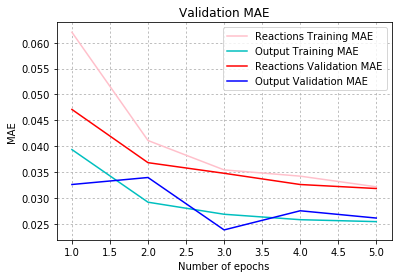

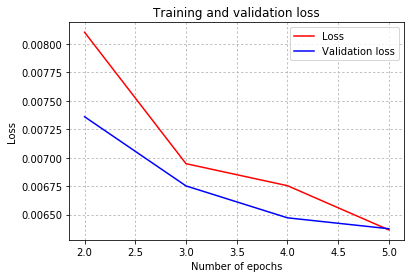

0.031815905
0.02610711


In [33]:
#Plotting the reactions and outputs errors of the example system
print('Results for version: ', v)
if v in [22, 23]:
    plot_output(h, nreit='')
    print(h.history['val_ReactLayer_mean_absolute_error'][-1])
else:
    plot_output(h, nreit)
    print(h.history['val_ReactLayer{}_mean_absolute_error'.format(nreit)][-1])


print(h.history['val_OutputLayer_mean_absolute_error'][-1])

In [32]:
evals = modelMNN.evaluate(xVal, yVal)
print(evals)

5000/5000 [==============================] - 1s 166us/sample - loss: 0.0082 - ReactLayer0_loss: 0.0097 - ReactLayer1_loss: 0.0106 - OutputLayer_loss: 0.0062 - ReactLayer0_mean_absolute_error: 0.0371 - ReactLayer1_mean_absolute_error: 0.0346 - OutputLayer_mean_absolute_error: 0.0408
[0.008162272138893605, 0.009656757, 0.010647485, 0.006170947, 0.03712469, 0.034648154, 0.040813673]


In [79]:
predictions = modelMNN.predict(xVal)

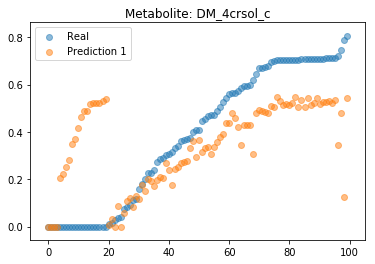

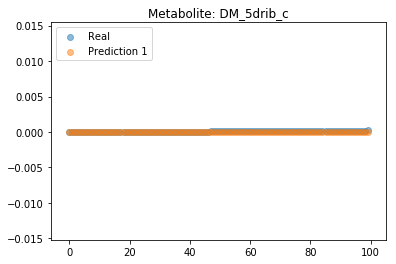

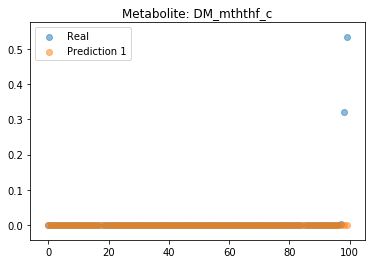

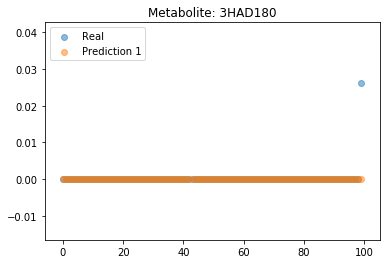

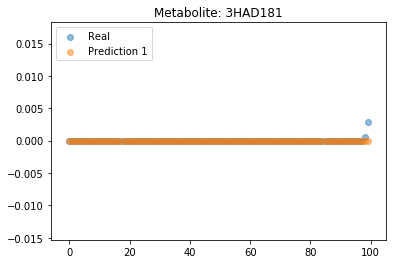

...

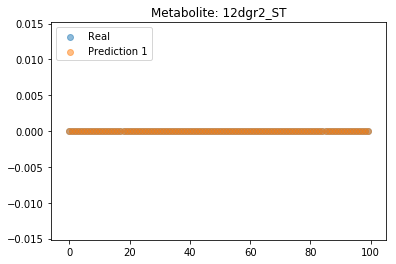

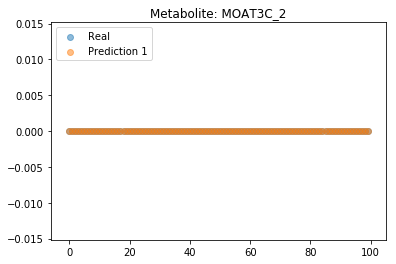

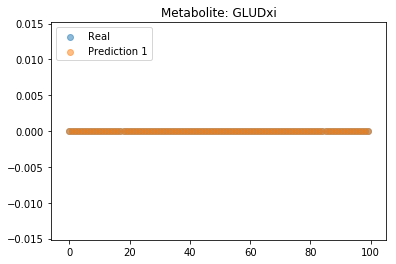

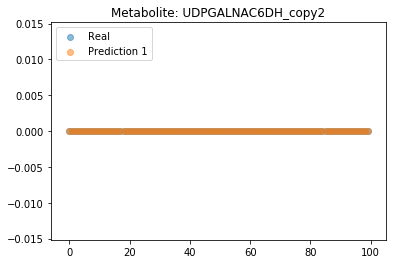

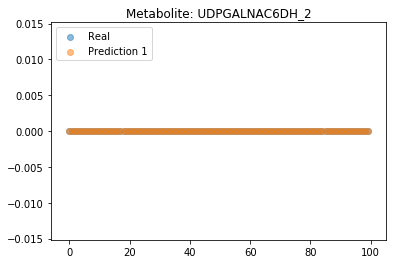

In [81]:
#Visualize the predictions vs the real values of some individuals for each output
n=200
oidx = 0
for idx in range(predictions[oidx].shape[1]):
    plot_prediction_comparison([predictions[oidx][:n,idx]], yVal[oidx][:n,idx], glayersIds[oidx][idx])

In [16]:
#Comparison of the different architectures
#MNN version: 22=HBB, 23=HBB_Shutdown, 24=Reiterative_Shutdown
versions = [22, 23, 24]
nreit=0
matCon = getConnectionsMatrix(glayers)
ncv=5

In [17]:
#Analysis of the errors in the 100 strains database for versions 22, 23 and 24
reactMAEs, outMAEs = {}, {}
histReacts = {}
for i in range(ncv):
    print('\nRound {} / {}'.format(i+1, ncv))
    #Shuffling dataset
    inout = shuffle_dataset([netInps2, inpStrains, *oriNetOuts2])
    netInps2, inpStrains, oriNetOuts2 = inout[0], inout[1], inout[2:]

    for v in versions:
        for sparse in [False, True]:
            print('\nWorking with version {}- Sparse {}'.format(v,sparse))
            #Producing the training and validation sets depending on the version
            if v==24:
                nreit=1
            if v in [21, 24]:
                netOuts2 = reitOutputs(oriNetOuts2, nreit)
            else:
                netOuts2 = oriNetOuts2

            trainProp, valProp = 0.9, 0.1
            if v in [23, 24]:
                xTrain, xVal, xTest = divide_set([netInps2, inpStrains], trainProp, valProp)
                yTrain, yVal, yTest = divide_set(netOuts2, trainProp, valProp)

            else:
                xTrain, xVal, xTest = divide_set([netInps2], trainProp, valProp)
                yTrain, yVal, yTest = divide_set(netOuts2, trainProp, valProp)
                xTrain = xTrain[0]

            #Make the reiterative layers.
            #MNN version: 22=HBB, 23=HBB_Shutdown, 24=Reiterative_Shutdown
            if v==22:
                if sparse:
                    modelMNN = build_MNNv2_2(medium_metabs, glayersIds, nreit, nneurons=128, matConnections=matCon)
                else:
                    modelMNN = build_MNNv2_2(medium_metabs, glayersIds, nreit, nneurons=128)
            elif v==23:
                if sparse:
                    modelMNN = build_MNNv2_3(medium_metabs, normZeros, glayersIds, nreit, nneurons=128, matConnections=matCon)
                else:
                    modelMNN = build_MNNv2_3(medium_metabs, normZeros, glayersIds, nreit, nneurons=128)
            elif v==24:
                if sparse:
                    modelMNN = build_MNNv2_4(medium_metabs, normZeros, glayersIds, nreit, nneurons=128, matConnections=matCon)
                else:
                    modelMNN = build_MNNv2_4(medium_metabs, normZeros, glayersIds, nreit, nneurons=128)
            #modelMNN.summary()

            #Teianing the system
            h = modelMNN.fit(xTrain, yTrain, epochs=5, verbose=4, validation_data=(xVal, yVal))
            
            if v==23:
                reacts = h.history['val_ReactLayer_mean_absolute_error']
            elif v==24:
                reacts = [h.history['val_ReactLayer0_mean_absolute_error'],
                          h.history['val_ReactLayer1_mean_absolute_error']]
            
            evals = modelMNN.evaluate(xVal, yVal)
            reactMAE, outMAE = evals[-2:]

            #Saving the MAE results
            key=str(v)+str(sparse)
            if key in reactMAEs:
                reactMAEs[key].append(reactMAE)
                outMAEs[key].append(outMAE)
            else:
                reactMAEs[key] = [reactMAE]
                outMAEs[key] = [outMAE]
            
            #Saving the reactions results
            if not key in histReacts:
                histReacts[key] = [reacts]
            else:
                histReacts[key].append(reacts)




Round 1 / 5

Working with version 24- Sparse False
Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.
Train on 180000 samples, validate on 20000 samples
Instructions for updating:
Use tf.cast instead.
Epoch 1/5
Epoch 2/5
Epoch 3/5
Epoch 4/5
Epoch 5/5
20000/20000 [==============================] - 2s 77us/sample - loss: 0.0052 - ReactLayer0_loss: 0.0062 - ReactLayer1_loss: 0.0100 - OutputLayer_loss: 0.0023 - ReactLayer0_mean_absolute_error: 0.0294 - ReactLayer1_mean_absolute_error: 0.0278 - OutputLayer_mean_absolute_error: 0.0264

Round 2 / 5

Working with version 24- Sparse False
Train on 180000 samples, validate on 20000 samples
Epoch 1/5
Epoch 2/5
Epoch 3/5
Epoch 4/5
Epoch 5/5
20000/20000 [==============================] - 2s 76us/sample - loss: 0.0058 - ReactLayer0_loss: 0.0082 - ReactLayer1_loss: 0.0107 - OutputLayer_loss: 0.0022 - ReactLayer0_mean_absolute_error: 0.0319 - ReactLayer1_mean_absolute_error: 0.0316 

In [18]:
#Visualize the errors of the different systems
for key in reactMAEs:
    print('\n',key)
    print('Reactions: ', np.mean(reactMAEs[key]))
    print('Output: ', np.mean(outMAEs[key]))


 22False
Reactions:  0.036921848
Output:  0.039762255

 22True
Reactions:  0.033086095
Output:  0.03837932

 23False
Reactions:  0.03596421
Output:  0.035330527

 23True
Reactions:  0.029943919
Output:  0.04186688

 24False
Reactions:  0.04488458
Output:  0.032871064

 24True
Reactions:  0.030081177
Output:  0.03690065


In [22]:
#Saves in a file the errors of the reactions and output layers after the 5 epochs
save=False
if save:
    filename = 'shutdownAnalysis_Small.csv'
    with open('results/{}'.format(filename), 'w') as f:
        for key in reactMAEs:
            f.write('\n'+key)
            f.write('\nReactions;' + ';'.join(list(map(str,reactMAEs[key]))))
            f.write('\nOutput;' + ';'.join(list(map(str,outMAEs[key]))))

In [18]:
#Calculates the average of the reaction errors based on the training histories
averages={}
for key in histReacts:
    averages[key]=np.mean(histReacts[key], axis=0)

In [21]:
#Visualize the average reactions errors among the epochs 
for key in averages:
    for i in range(2):
        print(averages[key][i])

[0.03655248 0.03263399 0.0308938  0.03032925 0.03022826]
[0.05063037 0.0389042  0.03454216 0.03111607 0.02969951]


In [14]:
#with open('results/historyReactionErrors50Th.pickle', 'wb') as handle:
    #pickle.dump(histReacts, handle)
    #print('Progress saved')

#Load the error histories of the trained networks
toLoad=False
if toLoad:
    with open('results/historyReactionErrors50Th.pickle', 'rb') as handle:
        histReacts = pickle.load(handle)

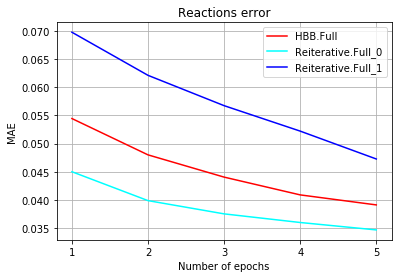

In [33]:
#Cheks the error of the reiterative reactions layers compared to the one in the HBB Shutdown model
xs=list(range(1,6))
colors=['cyan','blue']
legends={'23True':'HBB.Sparse', '24True':'Reiterative.Sparse', '23False':'HBB.Full', 
        '24False':'Reiterative.Full'}

sparse='False'
for key in averages:
    if sparse in key:
        if len(averages[key])==5:
            plt.plot(xs, averages[key], label=legends[key], color='red')
        else:
            for i in range(2):
                plt.plot(xs, averages[key][i], label='{}_{}'.format(legends[key], i), color=colors[i])

plt.title('Reactions error')
plt.xlabel('Number of epochs')
plt.ylabel('MAE')
plt.xticks(xs)
plt.legend()
plt.grid()
plt.savefig('images/ReactionsErrors_Sparse{}'.format(sparse))

plt.show()


In [1]:
#Build the mutant models
buildMutant=False
if buildMutant:
    modelsFolder = 'allShigellaModels/'
    buildMutantModels(modelsFolder, glayers, nameBase='ShigellaStrain', nModels=22, switchRange=[2,10])

In [2]:
#Build the FBA Complete dataset of the strains stored in a folder
doFBA=False
if doFBA:
    #Generate the FBAs of the models in the folder
    modelsFolder = 'shutDown/'
    FBAsFolder = 'shutDownDatabase/'
    nFBAs=5000
    modelNames = modelNamesFromFolder(modelsFolder, ext='.json')

    i=0
    for curModelName in modelNames:
        filebase = FBAsFolder + 'shutDownMNNv2_' + curModelName
        print('\n',curModelName)
        inpFile = (filebase + '_inputs.pickle').split('/')[1]
        #print(inpFile)

        if not inpFile in os.listdir(FBAsFolder):
            curModel = cobra.io.load_json_model(modelsFolder + curModelName + '.json')
            netInps, netOuts = buildAdaptedDataset(curModel, medium_metabs, glayers, glayersIds, nFBAs, vb=True)

            print('Input shape: ',netInps.shape)
            print('Reactions shape: ',netOuts[0].shape)
            print('Exchanges shape: ',netOuts[-1].shape)

            saveInOut(netInps, netOuts, filebase, append=True)
        i+=1
        print('{} / {} created'.format(i,len(modelNames)))



In [ ]:
#Check the shape of the data stored in a file
doThis=True
if doThis:    
    strain = 'iE2348C_1286'
    filebase = 'shutDownDatabase/shutDownMNNv2_{}'.format(strain)

    #filebase = 'iYS1720_MNNv2_test'
    netInps, netOuts = loadInOut(filebase)
    print('Input shape: ',netInps.shape)
    print('Reactions shape: ',netOuts[0].shape)
    print('Exchanges shape: ',netOuts[-1].shape)
    
    print(np.mean(netOuts[1], axis=0))